# Analysis Notebook 1

For my analysis notebook, I wanted to look at data about service requests that the city of Berkeley's 311 line receives. This is of interest to me because I have lived in Berkeley for the last six years, and I sometimes use 311 to report minor issues like missed trash collection or potholes. 

I accessed the data here: https://dev.socrata.com/foundry/data.cityofberkeley.info/bscu-qpbu, and chose a subset of the data for the year 2023. 

The first part of this notebook is my Exploratory Data Analysis (EDA), where I look at how the requests are classified, which ones are the most common, and how long it takes to resolve these issues. This is mostly to familiarize myself and the reader of this notebook with the data. The documentation for the dataset did not include explanations of what the values in each category for certain requests were, so that is why I spent a lot of time on the EDA. This also allowed me to narrow my focus for the statistical analysis in the second half of the notebook. 

For the statistical analysis portion of this notebook, I chose to look at sidewalk issues, which are issues with the condition, maintenance, and repair of sidewalks in the city of Berkeley. I am curious as to whether the time of year that a request for a sidewalk issue is received affects the time it takes to resolve the issue. I couldn't find any literature online that discussed what times of year were most common or best for cities to undertake street or sidewalk repairs, but I can at the very least contextualize this with what I know about living in the city of Berkeley and what I have observed. 

I know that Berkeley is a college town, and that there appear to be more people and more foot traffic in certain neighborhoods like Southside and Elmwood during the Fall (latter half of August through first half of December) and Spring (latter half of January through first half of May) semesters that the university is in session. There are still people here in the summer months (latter half of May through first half of August), but just walking around the city, foot traffic appears to be much less. This could be because students are out of town, and other residents are either working or out of town as well. Additionally, because we tend to have dry summers in Berkeley, summer seems like better a better time to undertake than during winter when the weather is generally colder and wetter. The city might be more responsive to requests for sidewalk issues in the summer as opposed to winter, but again, I cannot find any literature that establishes this as a pattern in Berkeley, or in any other US city. Is there a difference in time taken to resolve a sidewalk issue in the summer and winter?

I use a t-test later in this notebook to explore this question. The null and alternative hypothesis are also discussed in that portion of the notebook.

# Importing and Cleaning the Data

In [4]:
!pip install wget

#Import packages

import requests
import json
import seaborn as sns
import pandas as pd
import wget
import numpy as np
import matplotlib.pyplot as plt

In [5]:
#url = https://data.cityofberkeley.info/resource/bscu-qpbu.json?$where=date_opened between '2023-01-01T00:00:00.000' and '2023-12-31T00:00:00.000'&$limit=50000

url = "https://data.cityofberkeley.info/resource/bscu-qpbu.json?$where=date_opened%20between%20%272023-01-01T00:00:00.000%27%20and%20%272023-12-31T00:00:00.000%27&$limit=50000"
wget.download(url, 'Berkeley311Data.json')

-1 / unknown

'Berkeley311Data (1).json'

In [6]:
#Load the file
file_path = "Berkeley311Data.json"

with open(file_path, 'r') as file:
    data_list = json.load(file)

#display the first object
data_list[0]

{'case_id': '121000976349',
 'date_opened': '2023-01-01T09:49:00.000',
 'case_status': 'Closed',
 'date_closed': '2023-01-03T07:55:05.000',
 'request_category': 'Streets, Utilities, and Transportation',
 'request_subcategory': 'Storm',
 'request_detail': 'Storm Problem',
 'object_type': 'Property',
 'street_address': 'Intersection of Mathews and Carleton, BERKELEY, CA',
 'city': 'Berkeley',
 'state': 'CA',
 'neighborhood': 'Berkeley'}

In [7]:
#convert the .json file to .csv to work with in Pandas

df = pd.read_json(file_path)

df.to_csv()

',case_id,date_opened,case_status,date_closed,request_category,request_subcategory,request_detail,object_type,street_address,city,state,neighborhood,apn,latitude,longitude,location\n0,121000976349,2023-01-01T09:49:00.000,Closed,2023-01-03T07:55:05.000,"Streets, Utilities, and Transportation",Storm,Storm Problem,Property,"Intersection of Mathews and Carleton, BERKELEY, CA",Berkeley,CA,Berkeley,,,,\n1,121000976350,2023-01-01T09:51:00.000,Closed,2023-01-05T02:30:55.000,"Streets, Utilities, and Transportation",Storm,Storm Problem,Property,"Intersection of Mathews and Carleton, BERKELEY, CA",Berkeley,CA,Berkeley,,,,\n2,121000976351,2023-01-01T10:28:00.000,Closed,2023-01-06T00:35:41.000,"Streets, Utilities, and Transportation",Storm,Storm Problem,Property,"Intersection of Grant and Berkeley Way, BERKELEY, CA",Berkeley,CA,Berkeley,,,,\n3,121000976352,2023-01-01T12:24:00.000,Closed,2023-01-04T00:28:20.000,"Streets, Utilities, and Transportation",Clean City Program,Illegal Dumping - City Proper

In [8]:
df.head(5)

,case_id,date_opened,case_status,date_closed,request_category,request_subcategory,request_detail,object_type,street_address,city,state,neighborhood,apn,latitude,longitude,location
0,121000976349,2023-01-01T09:49:00.000,Closed,2023-01-03T07:55:05.000,"Streets, Utilities, and Transportation",Storm,Storm Problem,Property,"Intersection of Mathews and Carleton, BERKELEY...",Berkeley,CA,Berkeley,NaN,NaN,NaN,NaN
1,121000976350,2023-01-01T09:51:00.000,Closed,2023-01-05T02:30:55.000,"Streets, Utilities, and Transportation",Storm,Storm Problem,Property,"Intersection of Mathews and Carleton, BERKELEY...",Berkeley,CA,Berkeley,NaN,NaN,NaN,NaN
2,121000976351,2023-01-01T10:28:00.000,Closed,2023-01-06T00:35:41.000,"Streets, Utilities, and Transportation",Storm,Storm Problem,Property,"Intersection of Grant and Berkeley Way, BERKEL...",Berkeley,CA,Berkeley,NaN,NaN,NaN,NaN
3,121000976352,2023-01-01T12:24:00.000,Closed,2023-01-04T00:28:20.000,"Streets, Utilities, and Transportation",Clean City Program,Illegal Dumping - City Property,Property,"Intersection of Belvedere and Cedar, BERKELEY, CA",Berkeley,CA,Berkeley,NaN,NaN,NaN,NaN
4,121000976353,2023-01-01T13:01:00.000,Closed,2023-01-04T11:28:38.000,General Questions/information,Miscellaneous,Miscellaneous Internet Request,Unknown,NaN,Berkeley,CA,Berkeley,NaN,NaN,NaN,NaN


In [9]:
#make sure all the rows imported

len(df)

50000

In [10]:
#Because there was a limit of 50000 rows for the API, I wanted to see what date the data cut off
df.tail()

,case_id,date_opened,case_status,date_closed,request_category,request_subcategory,request_detail,object_type,street_address,city,state,neighborhood,apn,latitude,longitude,location
49995,121001041270,2023-11-20T13:37:45.000,Closed,2023-11-23T22:48:01.000,Traffic and Transportation,Parking,Pay and Display Repair,Property,2400 BANCROFT WAY,Berkeley,CA,Berkeley,055 187801400,37.868173,-122.261211,"{'latitude': '37.86817275', 'longitude': '-122..."
49996,121001041272,2023-11-20T13:38:59.000,Closed,2023-11-20T06:47:00.000,"Streets, Utilities, and Transportation",Sewer Maintenance,Sewer Problem,Property,2350 SPAULDING AVE,Berkeley,CA,Berkeley,055 191404703,37.864242,-122.280585,"{'latitude': '37.86424196', 'longitude': '-122..."
49997,121001041273,2023-11-20T13:40:00.000,Closed,2023-11-25T05:50:39.000,"Streets, Utilities, and Transportation",Clean City Program,Mattress Program,Property,1217 CURTIS ST,Berkeley,CA,Berkeley,060 241202301,37.882439,-122.289365,"{'latitude': '37.88243871', 'longitude': '-122..."
49998,121001041271,2023-11-20T13:40:11.000,Open,NaN,"Parks, Trees and Vegetation",Trees,Tree Pruning,Property,2316 WEBSTER ST,Berkeley,CA,Berkeley,052 157600400,37.854710,-122.261519,"{'latitude': '37.85471005', 'longitude': '-122..."
49999,121001041274,2023-11-20T13:44:54.000,Closed,2023-11-22T14:08:38.000,Refuse and Recycling,Commercial,Commercial Lost or Stolen Cart,Property,2414 SIXTH ST,Berkeley,CA,Berkeley,056 194301001,37.860985,-122.295795,"{'latitude': '37.86098534', 'longitude': '-122..."


In [11]:
#Figuring out which columns have null values
df.isnull().sum()

case_id                    0
date_opened                0
case_status                0
date_closed             5261
request_category           0
request_subcategory        0
request_detail             0
object_type                0
street_address          7465
city                       0
state                      0
neighborhood               0
apn                    11554
latitude               12106
longitude              12106
location               12106
dtype: int64

The data has several different columns. The API documentation doesn't provide exact definitions for what each column means, but identifying what the values are in most of the columns can be done contextually. The 'case_id' column is the unique identifier assigned to each 311 request. 'date_opened' is ostensibly the column containing a date and timestamp for the date and time at which the request was received or opened. 'case_status' XXX. 'date'_closed' is likely the date that the request was resolved or completed. 'request_category' is the broad category in which the request fits, like "Parks, Trees and Vegetation" or "Graffiti and Vandalism". 'request_subcategory' is a category under the request category, that includes a broader scope of issues. 'request_detail' is the more specific issue at question in the 311 case. 'object_type' denotes whether it is a personal or property issue, among a couple other possible values. I am not sure what the column 'apn' means. The columns for 'street_address', 'city', 'state', 'latitude', and 'longitude' would be useful if using geojson to visualize the locations of request on a map, but I will not be using them in the statistical analysis in this notebook. The 'neighborhood' column only has one value, 'Berkeley', which is not a particularly useful column, since the 'city' column also has 'Berkeley' as its only value. It would be more helpful if the 'neighborhood' column specified the specific neighborhood in the city of Berkeley from which the request emerged, such as 'Elmwood' or 'North Shattuck'. 

I went ahead and dropped the 'latitude', 'longitude', 'apn', 'street_address', 'neighborhood', 'state', and 'location' columns, since I do not plan to use them for my statistical analysis. 

In [13]:
#cleaning the data
df = df.drop(columns=['apn', 'street_address', 'neighborhood', 'state'])

# Exploratory Data Analysis

In the next three cells, I am trying to see what unique issues 311 deals with.

In [16]:
#Unique values for request_category
print('The request categories are:', df['request_category'].unique())

The request categories are: ['Streets, Utilities, and Transportation' 'General Questions/information'
 'Refuse and Recycling' 'Parks, Trees and Vegetation'
 'Traffic and Transportation'
 'Facilities, Electrical & Property Management'
 'Other Account Services and Billing' 'Government Activity'
 'Graffiti and Vandalism' 'Equipment Maintenance' 'Disability Compliance']


In [17]:
#Seeing what request subcategories exist
print('The request subcategories are:', df['request_subcategory'].unique())

The request subcategories are: ['Storm' 'Clean City Program' 'Miscellaneous' 'Residential'
 'Sidewalk/Street Maintenance' 'Sewer Maintenance' 'Commercial'
 'Landscape Maintenance' 'Traffic Maintenance' 'Trees'
 'Electrical Services' 'Animal License' 'Marina'
 'Account Services and Billing' 'Inquiry' 'Request'
 'Rental Housing Safety Program' 'Parking' 'Graffiti'
 'Parks/Marina Building Services' 'COVID-19' 'Business License'
 'Traffic Controls' 'City Vehicles' 'Program Access' 'Open Data' 'Traffic'
 'Vandalism']


In [18]:
#Seeing what the request types are- what things are people specifically asking the city to address
print('The request types are:', df['request_detail'].unique())

The request types are: ['Storm Problem' 'Illegal Dumping - City Property'
 'Miscellaneous Internet Request' 'Residential Missed Pickup' 'Potholes'
 'Sinkholes' 'Miscellaneous Service Request' 'Unknown Water Problem'
 'Commercial Service Day Increase' 'Litter Pickup - Parks'
 'Commercial Lost or Stolen Cart' 'Commercial Missed Pickup'
 'Street Striping/Marking (Refresh)' 'Illegal Dumping - Private Property'
 'Residential Lost or Stolen Cart' 'Broken Branch or Tree'
 'Commercial Customer Complaint' 'Street Lights - Repair'
 'Parks Landscape Maintenance' 'Sewer Problem'
 'Pressure Washing (steam-cleaning)' 'Animal License Account Change'
 'Residential Cart Size Decrease' 'Residential Reminder' 'Tree Pruning'
 'Pedestrian Signals' 'Residential Customer Complaint'
 'Commercial Site Inspection' 'Residential Service Start'
 'Payment Collection - Marina' 'Commercial Cart Size Increase'
 'Residential Cart Size Increase' 'Residential Bulky Pickup'
 'Gutter Repair' 'Payment Collection - Refuse an

I used the result from the previous cell in the next cell to create an array of the various request_details, in order to get the count later.

In [20]:
#making an array of the different request types
requesttypes = ['Commercial Site Inspection', 'Overgrown Vegetation/Turf',
 'Street Lights - Repair', 'Payment Collection - Miscellaneous',
 'Commercial Customer Complaint', 'Payment Collection - Marina',
 'Miscellaneous Internet Request', 'Storm Problem',
 'Payment Collection - Refuse and Recycling',
 'Illegal Dumping - City Property', 'TNC AR10.2',
 'Address Change - Miscellaneous', 'Litter Pickup - Parks',
 'Graffiti Abatement - Parks', 'Parks Landscape Maintenance', 'Potholes',
 'Median Vegetation Maintenance', 'Hand Sweeping',
 'Miscellaneous Service Request', 'Penalty Removal - Miscellaneous',
 'Residential Missed Pickup', 'Miscellaneous - PW',
 'Commercial Lost or Stolen Cart', 'Cart Repair', 'Commercial Missed Pickup',
 'Commercial Special Pickup', 'Residential Lost or Stolen Cart',
 'Address Change - Refuse and Recycling', 'Residential Customer Complaint',
 'Residential Bulky Pickup', 'Sidewalk Problem', 'Commercial Service Start',
 'Unknown Water Problem', 'Parking Enforcement - 72 Hour',
 'Commercial Reminder', 'Residential Cart Size Decrease',
 'Payment Collection - RHSP', 'Graffiti Abatement - Traffic Maintenance',
 'Residential Missed Pickup Integration', 'Bin Repair',
 'Animal License Account Change', 'Facilities Electrical',
 'Forestry Miscellaneous', 'Pay and Display Repair',
 'Residential Service Start', 'Pathways', 'Parking Meter Repair',
 'Commercial Service Day Decrease', 'Residential Service Stop',
 'Residential Reminder', 'Residential Special Pickup', 'Stray Cart Removal',
 'Tree Pruning', 'Miscellaneous - PW Facilities',
 'Commercial Service Day Change', 'Tree Planting',
 'Traffic Signals - Repair', 'Encampment Complaint', 'Broken Branch or Tree',
 'Pressure Washing (steam-cleaning)', 'Illegal Dumping - Internet Request',
 'Account Adjustment Research - Business License',
 'Parking Enforcement - Abandoned Vehicle',
 'Account Adjustment Research - Refuse and Recycling',
 'Residential Site Inspection', 'Parking Citation Payment',
 'Residential Cart Size Increase', 'Commercial Cart Size Increase',
 'Mattress Program', 'Mechanical Street Sweeping',
 'Miscellaneous - Engineering', 'Kitchen Pail',
 'Tree Health Concerns - Insects and Disease',
 'Engineering - Sidewalk Issue', 'Business License Reprint', 'Tree Removal',
 'Roll Off Bin', 'Parking Citation Dispute',
 'Auto Pedestrian Signal Request', 'Illegal Dumping - Private Property',
 'Penalty Removal - Refuse and Recycling', 'Recycling - City of Berkeley',
 'Name Change - Refuse and Recycling', 'Sewer Problem', 'Curb Repainting',
 'Commercial Cart Size Decrease', 'Sign Repair and Reinstallation',
 'Account Adjustment Research - Miscellaneous', 'Commercial Service Stop',
 'Account Adjustment Research - Marina', 'Irrigation System',
 'Pedestrian Signals', 'Sinkholes',
 'Living or Sleeping in Abandoned Vehicle', 'Signage or Pavement Marking',
 'Residential Temporary Stop', 'Commercial Bin Size Increase',
 'Graffiti Abatement - Building Maintenance', 'Play Structures Repairs',
 'Porta Potties - Parks', 'Graffiti Abatement - Streets and Utilities',
 'Loading Zone Sticker', 'Engineering - Paving Issue',
 'Fire Fuel Chipper and Debris Bin', 'Barricade Pickup',
 'Miscellaneous - Transportation', 'Reclassified Test Records DUMMY',
 'Doors / Gates / Hardware', 'Residential Bin Size Increase',
 'Graffiti Abatement - Code Enforcement', 'Blue or Red Zone Install',
 'Graffiti Abatement - Internet Request', 'ODP New Dataset Request',
 'Commercial Service Day Increase',
 'Commercial Transfer Station Ticket Request',
 'Removal of Homeless Possessions', 'Plumbing',
 'Adopt-A-Drain / Orange Bag Pickup', 'Parking Citation Inquiry',
 'Street Striping/Marking (Refresh)', 'Leaks', 'Fixtures', 'Sports Equipment',
 'Penalty Removal - Marina', 'Commercial Bin Size Decrease',
 'Residential Service Day Increase', 'Residential Bin Size Decrease',
 'Commercial Temporary Stop', 'Restroom Cleaning', 'Bus Bench Repair',
 'City Vehicle Complaints', 'New Traffic Signal Request', 'Steam Cleaning',
 'Vegetation Violation Notice', 'Payment Collection - Business License',
 'Playground Maintenance', 'Address Change - RHSP',
 'Spill Cleanup (oil, hydraulic fuel, paint)',
 'Account Adjustment Research - RHSP', 'Name Change - RHSP', 'Gutter Repair',
 'Address Change - Marina', 'Street Light - New Installations',
 'Stump / Root Grinding', 'Name Change - Miscellaneous',
 'Commercial Foodware Ordinance', 'City Vehicle Service / Repair',
 'Residential Service Day Change', 'Fire Fuel', 'Utilities',
 'Vandalism in Parks', 'Adopt -A-Drain / Orange Bag Pickup',
 'City Vehicle Accidents', 'Low Income', 'Sports Field Maintenance',
 'Penalty Removal - RHSP', 'Keys / Locks',
 'Residential Service Day Decrease', 'Lagan Integration General Testing',
 'Commercial Crew Complaint', 'Address Change - Business License',
 'Miscellaneous', 'Stairs', 'Recycling - Ecology Center',
 'Residential Preferential Parking Research', 'Playground Inspection',
 'Residential Crew Complaint']

In [21]:
#Build a dictionary to store counts in the next cell

Request_Dict = {requesttype:0 for requesttype in requesttypes}

#print to make sure it worked
print(Request_Dict)

{'Commercial Site Inspection': 0, 'Overgrown Vegetation/Turf': 0, 'Street Lights - Repair': 0, 'Payment Collection - Miscellaneous': 0, 'Commercial Customer Complaint': 0, 'Payment Collection - Marina': 0, 'Miscellaneous Internet Request': 0, 'Storm Problem': 0, 'Payment Collection - Refuse and Recycling': 0, 'Illegal Dumping - City Property': 0, 'TNC AR10.2': 0, 'Address Change - Miscellaneous': 0, 'Litter Pickup - Parks': 0, 'Graffiti Abatement - Parks': 0, 'Parks Landscape Maintenance': 0, 'Potholes': 0, 'Median Vegetation Maintenance': 0, 'Hand Sweeping': 0, 'Miscellaneous Service Request': 0, 'Penalty Removal - Miscellaneous': 0, 'Residential Missed Pickup': 0, 'Miscellaneous - PW': 0, 'Commercial Lost or Stolen Cart': 0, 'Cart Repair': 0, 'Commercial Missed Pickup': 0, 'Commercial Special Pickup': 0, 'Residential Lost or Stolen Cart': 0, 'Address Change - Refuse and Recycling': 0, 'Residential Customer Complaint': 0, 'Residential Bulky Pickup': 0, 'Sidewalk Problem': 0, 'Commerci

In [22]:
#initialize the counter
total_requests = 0

#iterate through the request_detail column to count num of times a request appears 
for line in data_list:
    #debug line
    #print(line['request_detail'])
    Request_Dict[line['request_detail']] = Request_Dict[line['request_detail']] + 1
    total_requests = total_requests + 1

In [23]:
#Sort the dictionary in descending order
Request_Dict_sorted = sorted(Request_Dict.items(), key =lambda x:x[1], reverse=True)
Request_Dict_sorted

[('Miscellaneous Internet Request', 8616),
 ('Illegal Dumping - City Property', 4460),
 ('Commercial Missed Pickup', 3443),
 ('Miscellaneous Service Request', 2980),
 ('Residential Bulky Pickup', 1840),
 ('Residential Missed Pickup', 1382),
 ('Residential Lost or Stolen Cart', 1273),
 ('Residential Missed Pickup Integration', 1050),
 ('Commercial Customer Complaint', 984),
 ('Commercial Reminder', 963),
 ('Commercial Site Inspection', 928),
 ('Mattress Program', 857),
 ('Payment Collection - Refuse and Recycling', 789),
 ('Commercial Special Pickup', 764),
 ('Commercial Lost or Stolen Cart', 759),
 ('Potholes', 732),
 ('Payment Collection - Marina', 696),
 ('Residential Customer Complaint', 690),
 ('Cart Repair', 683),
 ('Tree Pruning', 599),
 ('Storm Problem', 542),
 ('Broken Branch or Tree', 540),
 ('Encampment Complaint', 530),
 ('Residential Service Start', 474),
 ('Sidewalk Problem', 463),
 ('Residential Reminder', 463),
 ('Residential Cart Size Increase', 459),
 ('Residential Car

It looks like the issue with the greatest number of 311 cases is 'Miscellaneous Internet Request'; there are 8,616 cases. I am not 100% sure what that means, but it could be related to internet outages. The other request_detail values that appear the most in the dataset are 'Illegal Dumping - City Property' at 4,460 cases, 'Commercial Missed Pickup' at 3,443 cases (I believe this is for commercial property trash pick up), and 'Miscellaneous Service Request', at 2,980 cases. 

There are several request_detail issues that have only 1 case appearing in the dataset. The last five are 'Residential Crew Complaint', 'Playground Inspection', 'Residential Preferential Parking Research', 'Stairs' and 'Miscellaneous'. 

# Finding Out Time Taken to Resolve a 311 Request

Because I plan to look at the amount of time taken to resolve 311 cases related to sidewalk issues, I need to add a column to the dataframe that includes this information.

In [27]:
#convert the date columns to pandas date_time objects
#consulted pandas documentation and ChatGPT (conversation included at end of notebook) for the following functions related to datetime conversion

df['date_opened'] = pd.to_datetime(df['date_opened'])
df['date_closed'] = pd.to_datetime(df['date_closed'])

I looked at the result returned earlier from df.isnull().sum() to see which columns have null values. The 'date_closed' column had 5,261 null values, which means that either the issue is not resolved yet, or the data was not entered and is actually missing. This can affect the usefulness of the statistical model, discussed later in this notebook. 

I still want to take the difference of the null values in 'date_closed' and existing values in 'date_opened', instead of just dropping the rows altogether. The reason for this is as mentioned before, that some issues may not have been resolved yet. Looking at only issues that have been resolved doesn't allow us to accurately gauge the descriptive statistics for response times for particular requests, since it omits that entire category of non-resolved issues.

In the following cell, I find the difference between the 'date_opened' and 'date_closed' columns while filling the null values with the current time using Timestamp.now(). This column is then appended to the dataframe. 

In [29]:
#to get resolution_time, I have to find the difference of time in 'date_closed' and 'date_opened'
#also referred to Chat GPT for help here, which I have included in a link at the end of this notebook
#using fillna to deal with null values in 'end_time' column
#using Timestamp.now() as the value because I am assuming the case is still open and I had errors just filling it with 0
#dividing by 3600 because I want the number of hours passed until resolution
df['resolution_time'] = (df['date_closed'].fillna(pd.Timestamp.now()) - df['date_opened']).dt.total_seconds() / 3600

Now, I want to see which requests take the longest to resolve. There are a large number of possible values in the 'request_detail' column, but from the API documentation, I know that they are specific issues under a specific 'request_subcategory'. It would take longer to go through each subcategory and get the distribution for resolution times, so I am going to assume that each one has some sort of outlier and take the median to be on the safer side, since it is less resistant to extreme values.

In [31]:
grouped_res_times = df.groupby('request_subcategory').median('resolution_time')
grouped_res_times

,case_id,latitude,longitude,resolution_time
request_subcategory,,,,
Account Services and Billing,1.210010e+11,37.867978,-122.273893,68.340556
Animal License,1.210010e+11,37.874639,-122.278319,169.400278
Business License,1.210010e+11,37.871047,-122.277875,98.140000
COVID-19,1.210010e+11,NaN,NaN,3362.270833
City Vehicles,1.210010e+11,37.865707,-122.282963,8780.137627
Clean City Program,1.210010e+11,37.868225,-122.275004,16.625833
Commercial,1.210010e+11,37.868154,-122.270111,91.751667
Electrical Services,1.210010e+11,37.868549,-122.271374,156.385833
Graffiti,1.210010e+11,37.868867,-122.280526,119.554583


In [32]:
#sort the resolution times
res_times_sort = sorted(grouped_res_times['resolution_time'].items(), key =lambda x:x[1], reverse=True)

In [33]:
#view sorted resolution times
res_times_sort

[('Open Data', 12701.944154486944),
 ('Program Access', 10637.26582115361),
 ('City Vehicles', 8780.137626709167),
 ('Traffic Controls', 6438.6852655980565),
 ('Traffic', 6320.206382799028),
 ('Landscape Maintenance', 6061.987222222222),
 ('COVID-19', 3362.2708333333335),
 ('Trees', 443.5398611111111),
 ('Inquiry', 437.21666666666664),
 ('Parks/Marina Building Services', 421.6144444444444),
 ('Traffic Maintenance', 249.2836111111111),
 ('Animal License', 169.40027777777777),
 ('Electrical Services', 156.38583333333332),
 ('Residential', 140.73833333333334),
 ('Graffiti', 119.55458333333334),
 ('Business License', 98.14),
 ('Commercial', 91.75166666666667),
 ('Sidewalk/Street Maintenance', 87.05),
 ('Request', 75.20569444444445),
 ('Account Services and Billing', 68.34055555555555),
 ('Rental Housing Safety Program', 42.18138888888889),
 ('Storm', 41.461666666666666),
 ('Marina', 24.877777777777776),
 ('Sewer Maintenance', 19.99388888888889),
 ('Parking', 19.417916666666667),
 ('Clean C

The top five longest median resolution times in Berkeley in 2023 are for the Request Subcategories of Open Data, Program Access, City Vehicles, Landscape Maintenance, and Traffic.

Open Data issues likely have to do with the repository of publicly available data for the city of Berkeley, and questions or issues that users of the site have. Perhaps the reason it takes so long is either because the issues are simply not marked as resolved, or they do in fact take a while to update and deal with data issues on the website.

From a quick Google search: it appears that Program Access issues are when an individual is "unable to access a City of Berkeley service, program, or facility because [they] have a disability". https://berkeleyca.gov/your-government/our-work/disability-compliance-program. This could have a long response time because retrofitting a facility to be accessible could have a long bureaucratic process associated with it and/or take a while to make the material changes to the facility that needs to be retrofitted. One way to check if the facility requests are causing there to be longer resolution times would be to pivot the 'object_type' (Unknown, Individual, Organization, or Property) for Program Access to see if the Program Access requests are related to property, organization, or an individual. I will not be doing that in this notebook since I plan to look specifically at sidewalk issues, but if I had more time and more context from the dataset, this could be another avenue to explore.

The lowest median resolution times in Berkeley in 2023 are for the Request Subcategories of Vandalism, Miscellaneous, Clean City Program, Parking, and Sewer Maintenance.

I am also keeping in mind that even though I looked at the median, there are probably outliers in some of the Request Subcategories. With more time, I would have removed outliers from each category and checked to see if they were due to unresolved issues or actually had 'date_closed' values. Since I am looking at sidewalk issues, I will be removing outliers for those requests.

# Sidewalk Issues

I am choosing to look at sidewalk issues in Berkeley. The information for typical sidewalk issues can be found here at the city of Berkeley's website: https://berkeleyca.gov/city-services/report-pay/report-issues/report-sidewalk-issue#no-back. The options to report appear on the page as raised, sunken, or uneven sidewalk, chipped or cracked sidewalk, damage by a tree root, or damaged curbs. People can also report other, unspecified issues with the sidewalk. 

I chose to isolate the rows for which the 'request_detail' value was 'Sidewalk Problem' or 'Engineering - Sidewalk Issue'. They both fall under the 'request_subcategory' 'Sidewalk/Street Maintenance', and for the purposes of this analysis, I am choosing to treat them as both related to repair or maintenance of sidewalks. If I had more time, I would probably contact the dataset owner and get more context on the differences between the two request_detail values.

# Creating a Dataframe of Only Sidewalk Issues 

In [38]:
#isolate rows with sidewalk issue as the value in 'request_detail'

#code with df. loc wasn't running with & operator and == to the two conditions, sidewalk problem and engineering - sidewalk issue
#so I stored the condition in a variable using .isin to get the rows that meet the conditions
#consulted https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.isin.html
cond_sidewalk = df['request_detail'].isin(['Sidewalk Problem', 'Engineering - Sidewalk Issue'])

sidewalk_df = df.loc[cond_sidewalk]

sidewalk_df

,case_id,date_opened,case_status,date_closed,request_category,request_subcategory,request_detail,object_type,city,latitude,longitude,location,resolution_time
168,121000976601,2023-01-03 11:30:54,Closed,2023-01-11 01:32:46,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Sidewalk Problem,Property,Berkeley,37.889930,-122.277147,"{'latitude': '37.8899299', 'longitude': '-122....",182.031111
170,121000976604,2023-01-03 11:37:00,Closed,2023-01-08 09:14:17,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Sidewalk Problem,Property,Berkeley,37.889930,-122.277147,"{'latitude': '37.8899299', 'longitude': '-122....",117.621389
181,121000976628,2023-01-03 11:59:30,Closed,2023-01-19 04:45:20,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Sidewalk Problem,Property,Berkeley,37.862271,-122.281441,"{'latitude': '37.86227059', 'longitude': '-122...",376.763889
504,121000977092,2023-01-04 13:51:00,Closed,2023-04-26 07:57:15,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Sidewalk Problem,Property,Berkeley,37.889596,-122.269807,"{'latitude': '37.88959572', 'longitude': '-122...",2682.104167
832,121000977493,2023-01-05 15:42:25,Closed,2023-01-20 04:55:39,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Sidewalk Problem,Property,Berkeley,37.869479,-122.293836,"{'latitude': '37.86947884', 'longitude': '-122...",349.220556
...,...,...,...,...,...,...,...,...,...,...,...,...,...
49759,121001040989,2023-11-17 13:39:00,Closed,2023-11-28 23:58:03,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Sidewalk Problem,Property,Berkeley,37.879745,-122.293439,"{'latitude': '37.87974532', 'longitude': '-122...",274.317500
49795,121001041026,2023-11-17 15:19:00,Open,NaT,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Sidewalk Problem,Property,Berkeley,37.890575,-122.256276,"{'latitude': '37.89057525', 'longitude': '-122...",5887.390821
49828,121001041059,2023-11-18 10:02:00,Closed,2023-11-28 03:49:05,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Engineering - Sidewalk Issue,Property,Berkeley,37.891321,-122.266101,"{'latitude': '37.89132079', 'longitude': '-122...",233.784722
49829,121001041060,2023-11-18 10:09:00,Open,NaT,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Engineering - Sidewalk Issue,Property,Berkeley,37.891321,-122.266101,"{'latitude': '37.89132079', 'longitude': '-122...",5868.557488


In [39]:
sidewalk_df.describe()

,case_id,date_opened,date_closed,latitude,longitude,resolution_time
count,5.210000e+02,521,468,437.000000,437.000000,521.000000
mean,1.210010e+11,2023-06-14 10:47:48.796545280,2023-06-23 04:19:17.547008768,37.870989,-122.272579,1168.446832
min,1.210010e+11,2023-01-03 11:30:54,2023-01-08 09:14:17,37.846848,-122.303108,-7.040833
25%,1.210010e+11,2023-03-16 11:37:00,2023-03-28 06:23:20.500000,37.860267,-122.281668,59.900556
50%,1.210010e+11,2023-06-20 18:05:00,2023-06-28 16:09:43,37.869052,-122.272431,154.153333
75%,1.210010e+11,2023-09-07 10:22:00,2023-09-21 07:42:39.750000128,37.880304,-122.264477,349.198333
max,1.210010e+11,2023-11-20 11:01:00,2024-04-26 02:56:42,37.903048,-122.237929,13164.751932
std,2.000589e+04,NaN,NaN,0.013110,0.013124,2828.301867


In [40]:
#checking to make sure shape is same
sidewalk_df.shape

(521, 13)

# Cleaning the Data

There appear to be outliers in the data above. The highest resolution time for a sidewalk issue in 2023 in Berkeley is 13,157.91 hours, or 548.25 days (rounded to two decimal places).

I wanted to deal with outliers in the data (based on 'resolution_time') above to hopefully conduct better statistical analysis, so I consulted this link https://www.geeksforgeeks.org/detect-and-remove-the-outliers-using-python/ to see if I could get rid of the outliers in the sidewalk data. From the summarization above, you can see that there is a negative value for the min resolution_time, which is impossible when contextualized with fixing a sidewalk issue. There is no way to undo time. That could possibly be due to an error in data entry, when the 'date_opened' or 'date_closed' was entered for that 'case_id'.

In [43]:
#Getting the IQR (Interquartile Range)

#reset index because I was getting errors without doing this
sidewalk_df = sidewalk_df.reset_index()

#compute the lower bound
Q1 = sidewalk_df['resolution_time'].quantile(0.25)

#compute the upper bound
Q3 = sidewalk_df['resolution_time'].quantile(0.75)

#compute IQR
IQR = Q3 - Q1
lower = Q1 - 1.5*IQR
upper = Q3 + 1.5*IQR

#array of Boolean values storing rows with outliers
upper_outliers = np.where(sidewalk_df['resolution_time'] >= upper)[0]
#debug line
print(upper_outliers)

lower_outliers = np.where(sidewalk_df['resolution_time'] <= lower)[0]
#debug line
print(lower_outliers)

[  3   7  17  20  21  26  27  31  33  36  38  41  43  55  58  62  66  69
  93  95  98 109 125 134 140 145 150 151 171 180 192 195 203 205 216 217
 219 223 240 243 246 248 250 259 269 274 276 281 282 283 288 289 292 294
 302 303 304 308 310 339 359 363 376 377 378 379 383 393 399 402 410 428
 443 444 445 446 449 450 457 461 462 469 473 480 490 517 519]
[]


In [44]:
sidewalk_df.drop(index=upper_outliers, inplace=True)
sidewalk_df.drop(index=lower_outliers, inplace=True)

In [45]:
#checking to see if it looks ok
sidewalk_df

,index,case_id,date_opened,case_status,date_closed,request_category,request_subcategory,request_detail,object_type,city,latitude,longitude,location,resolution_time
0,168,121000976601,2023-01-03 11:30:54,Closed,2023-01-11 01:32:46,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Sidewalk Problem,Property,Berkeley,37.889930,-122.277147,"{'latitude': '37.8899299', 'longitude': '-122....",182.031111
1,170,121000976604,2023-01-03 11:37:00,Closed,2023-01-08 09:14:17,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Sidewalk Problem,Property,Berkeley,37.889930,-122.277147,"{'latitude': '37.8899299', 'longitude': '-122....",117.621389
2,181,121000976628,2023-01-03 11:59:30,Closed,2023-01-19 04:45:20,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Sidewalk Problem,Property,Berkeley,37.862271,-122.281441,"{'latitude': '37.86227059', 'longitude': '-122...",376.763889
4,832,121000977493,2023-01-05 15:42:25,Closed,2023-01-20 04:55:39,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Sidewalk Problem,Property,Berkeley,37.869479,-122.293836,"{'latitude': '37.86947884', 'longitude': '-122...",349.220556
5,839,121000977498,2023-01-05 15:55:20,Closed,2023-01-26 04:00:34,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Sidewalk Problem,Property,Berkeley,37.873902,-122.278089,"{'latitude': '37.87390235', 'longitude': '-122...",492.087222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
514,49647,121001040850,2023-11-16 18:38:37,Closed,2023-11-16 19:20:30,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Sidewalk Problem,Property,Berkeley,37.869453,-122.270949,"{'latitude': '37.86945314', 'longitude': '-122...",0.698056
515,49723,121001040951,2023-11-17 11:58:00,Closed,2023-11-28 23:53:27,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Sidewalk Problem,Property,Berkeley,37.858467,-122.262305,"{'latitude': '37.85846747', 'longitude': '-122...",275.924167
516,49759,121001040989,2023-11-17 13:39:00,Closed,2023-11-28 23:58:03,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Sidewalk Problem,Property,Berkeley,37.879745,-122.293439,"{'latitude': '37.87974532', 'longitude': '-122...",274.317500
518,49828,121001041059,2023-11-18 10:02:00,Closed,2023-11-28 03:49:05,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Engineering - Sidewalk Issue,Property,Berkeley,37.891321,-122.266101,"{'latitude': '37.89132079', 'longitude': '-122...",233.784722


In [46]:
#checking to see if extreme values were dropped
sidewalk_df.describe()

,index,case_id,date_opened,date_closed,latitude,longitude,resolution_time
count,434.000000,4.340000e+02,434,434,369.000000,369.000000,434.000000
mean,26229.534562,1.210010e+11,2023-06-15 13:09:52.882488320,2023-06-22 02:11:18.499999744,37.870579,-122.272942,157.023783
min,168.000000,1.210010e+11,2023-01-03 11:30:54,2023-01-08 09:14:17,37.846848,-122.303108,-7.040833
25%,12177.750000,1.210010e+11,2023-03-17 09:20:30,2023-03-28 08:04:47.249999872,37.860177,-122.281919,43.742847
50%,27569.500000,1.210010e+11,2023-06-21 02:35:00,2023-06-27 18:58:22.500000,37.868867,-122.273574,118.346111
75%,40435.000000,1.210010e+11,2023-09-11 15:27:30,2023-09-21 07:39:52.750000128,37.879745,-122.264634,207.027639
max,49946.000000,1.210010e+11,2023-11-20 11:01:00,2023-12-05 00:12:54,37.902664,-122.237929,763.133333
std,15323.308851,1.994864e+04,NaN,NaN,0.012869,0.012980,149.033405


After dropping values outside of the IQR, I am left with 435 rows instead of the original 521 for Sidewalk related issues.

The cell above shows that the negative values still exist in the data. The work I did above seems to have dealt with extreme positive values but not extreme negative values. Next, I will remove the rows with negative values from my dataframe. This is a more convoluted way to do it, probably, but it is more intuitive for me to do it this way at this stage in the class. 

In [48]:
#defining the rows for which there are lower outliers
lower_outliers_df = sidewalk_df.loc[sidewalk_df['resolution_time'] < 0]

In [49]:
#dropping the rows with lower outliers
sidewalk_df.drop(index=lower_outliers_df.index, inplace=True)

sidewalk_df

In [51]:
#checking to see if it worked
sidewalk_df.describe()

,index,case_id,date_opened,date_closed,latitude,longitude,resolution_time
count,422.000000,4.220000e+02,422,422,357.000000,357.000000,422.000000
mean,26490.040284,1.210010e+11,2023-06-17 04:52:05.725118720,2023-06-23 22:28:59.376777216,37.870687,-122.273042,161.614903
min,168.000000,1.210010e+11,2023-01-03 11:30:54,2023-01-08 09:14:17,37.846848,-122.303108,0.698056
25%,12450.750000,1.210010e+11,2023-03-18 15:47:51.750000128,2023-03-31 08:18:02,37.860267,-122.282009,50.364375
50%,27826.500000,1.210010e+11,2023-06-22 12:43:30,2023-06-29 05:55:42.500000,37.869007,-122.273738,128.176528
75%,41029.250000,1.210010e+11,2023-09-14 15:50:54,2023-09-26 03:50:17.500000,37.879745,-122.264634,207.523958
max,49946.000000,1.210010e+11,2023-11-20 11:01:00,2023-12-05 00:12:54,37.902664,-122.237929,763.133333
std,15354.137760,1.998491e+04,NaN,NaN,0.012799,0.013027,148.592823


The describe function above shows that there are no longer any negative values in the data for sidewalk issues in Berkeley in the year 2023. There are 422 individual cases, with an average resolution time of 161.61 hours (rounded to two decimal places). This is approximately 6.73 days (rounded to two decimal places). The median resolution time for sidewalk issues in 2023 in Berkeley is 128.18 hours, or 5.34 days (rounded to two decimal places). The longest resolution time for sidewalk issues in Berkeley for the year 2023 is 763.13 hours or 31.79 days (rounded to two decimal places). 

# Preparing the Data for Analysis

I converted the data to month and then to season for purposes of my analysis, since I am asking if the resolution time in summer is shorter than in the winter. 

In [55]:
#adding a column for the month that the issue was opened with 311

sidewalk_df['month_opened'] = sidewalk_df['date_opened'].dt.month

#checking if the function took it as a obj or int
#we want it as an object because the number refers to a month, which is categorical
print(sidewalk_df['month_opened'].dtype)

int32


In [56]:
#convert integer for month to season
# first create a dictionary that assigns each integer for the month to the season that month is in

Month_Dict = {1: 'winter', 2:'winter', 3:'spring', 4:'spring', 5:'spring', 6:'summer', 7:'summer', 8:'summer', 9:'fall', 10:'fall', 11:'fall', 12:'winter'}

In [57]:
#apply the dictionary to the column
sidewalk_df['month_opened'] = [Month_Dict[k] for k in sidewalk_df['month_opened']]
sidewalk_df

,index,case_id,date_opened,case_status,date_closed,request_category,request_subcategory,request_detail,object_type,city,latitude,longitude,location,resolution_time,month_opened
0,168,121000976601,2023-01-03 11:30:54,Closed,2023-01-11 01:32:46,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Sidewalk Problem,Property,Berkeley,37.889930,-122.277147,"{'latitude': '37.8899299', 'longitude': '-122....",182.031111,winter
1,170,121000976604,2023-01-03 11:37:00,Closed,2023-01-08 09:14:17,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Sidewalk Problem,Property,Berkeley,37.889930,-122.277147,"{'latitude': '37.8899299', 'longitude': '-122....",117.621389,winter
2,181,121000976628,2023-01-03 11:59:30,Closed,2023-01-19 04:45:20,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Sidewalk Problem,Property,Berkeley,37.862271,-122.281441,"{'latitude': '37.86227059', 'longitude': '-122...",376.763889,winter
4,832,121000977493,2023-01-05 15:42:25,Closed,2023-01-20 04:55:39,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Sidewalk Problem,Property,Berkeley,37.869479,-122.293836,"{'latitude': '37.86947884', 'longitude': '-122...",349.220556,winter
5,839,121000977498,2023-01-05 15:55:20,Closed,2023-01-26 04:00:34,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Sidewalk Problem,Property,Berkeley,37.873902,-122.278089,"{'latitude': '37.87390235', 'longitude': '-122...",492.087222,winter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
514,49647,121001040850,2023-11-16 18:38:37,Closed,2023-11-16 19:20:30,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Sidewalk Problem,Property,Berkeley,37.869453,-122.270949,"{'latitude': '37.86945314', 'longitude': '-122...",0.698056,fall
515,49723,121001040951,2023-11-17 11:58:00,Closed,2023-11-28 23:53:27,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Sidewalk Problem,Property,Berkeley,37.858467,-122.262305,"{'latitude': '37.85846747', 'longitude': '-122...",275.924167,fall
516,49759,121001040989,2023-11-17 13:39:00,Closed,2023-11-28 23:58:03,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Sidewalk Problem,Property,Berkeley,37.879745,-122.293439,"{'latitude': '37.87974532', 'longitude': '-122...",274.317500,fall
518,49828,121001041059,2023-11-18 10:02:00,Closed,2023-11-28 03:49:05,"Streets, Utilities, and Transportation",Sidewalk/Street Maintenance,Engineering - Sidewalk Issue,Property,Berkeley,37.891321,-122.266101,"{'latitude': '37.89132079', 'longitude': '-122...",233.784722,fall


In [58]:
print('The number of requests in winter:', (sidewalk_df['month_opened'] == 'winter').sum())
print('The number of requests in spring:', (sidewalk_df['month_opened'] == 'spring').sum())
print('The number of requests in summer:', (sidewalk_df['month_opened'] == 'summer').sum())
print('The number of requests in fall:', (sidewalk_df['month_opened'] == 'fall').sum())

The number of requests in winter: 80
The number of requests in spring: 104
The number of requests in summer: 118
The number of requests in fall: 120


In Berkeley in 2023, winter and spring experienced a smaller number of 311 requests for sidewalk issues, with winter having the least requests at 80. Summer and fall 2023 experienced the most requests, with summer trailing fall by only 2 requests. 

# Statistical Analysis

When I originally started on this project, I wanted to do something using linear regression. The scikit-learn cheat sheet https://scikit-learn.org/stable/machine_learning_map.html showed that I should use the LASSO model of linear regression based on the way I went through the pathway. However, as I got further into the project, I settled on working with categorical variables in the dataset to predict a numeric variable, and from my understanding of linear regression as of now, that wouldn't be the best model to use.

I'm also still refreshing on statistical analysis, but based on my understanding, I have developed the following:

**My Statistical Analysis**

What I know about the summer months are that they are dry, and Berkeley appears to have visibly less foot traffic in some places; the winter months in Berkeley tend to be wet, rainy, and windy. I believe the weather conditions in the winter might affect the time it takes to address a sidewalk repair issue. Is a difference in the resolution time for sidewalk issues filed through 311 depending on the season?

**Null Hypothesis:** The difference in mean resolution time in hours for sidewalk issues opened in the summer months and sidewalk issues resolved in the winter months is equal to 0. 

**Alternative Hypothesis:** The difference in mean resolution time in hours for sidewalk issues opened in the summer months and sidewalk issues resolved in the winter months is not 0.

# Determining Statistical Significance

I am going to use a statistical to determine if there is a statistically significant relationship between the mean resolution time of sidewalk issues opened in the summer months and sidewalk issues opened in the winter months in Berkeley. 

The following is a t-test, similar to the one performed in the lectures from Week 3 by Professor Obeng. (Lecture 3-6-2).

First, I used a boxplot to compare the resolution times by the season the issue was filed.

<Axes: xlabel='resolution_time'>

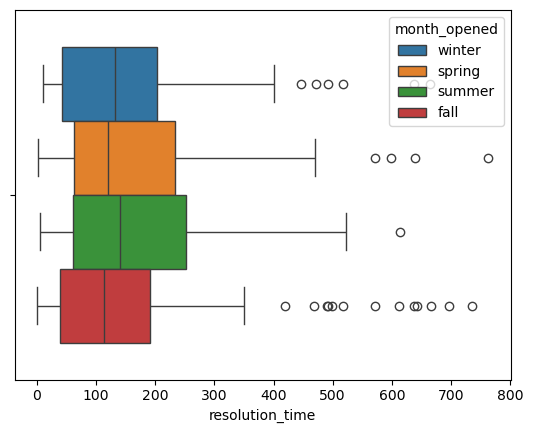

In [62]:
# Comparing Resolution Times by Season
sns.boxplot(data=sidewalk_df, x='resolution_time', hue='month_opened')

You can see on the boxplot that there are many outliers in the fall, and some for the summer, winter, and spring. The lower quartile of the winter boxplot and fall boxplots fall lower than the lower quartile for spring and summer, meaning that the 25th percentile of resolution_times is a lower amount of time than for those in the distribution of spring and summer months. Summer appears to have the highest median resolution time in hours, but winter appears close to that value.

In [64]:
#take difference in means between summer and winter

#first find mean of summer
summer_mean = sidewalk_df[sidewalk_df['month_opened'] == 'summer']['resolution_time'].mean()
print(summer_mean)
print(summer_mean/24)

162.29965395480224
6.762485581450093


The average time it takes to resolve an issue opened in a summer month is 162.30 hours or 6.76 days (rounded).

In [66]:
#find mean of winter
winter_mean = sidewalk_df[sidewalk_df['month_opened'] == 'winter']['resolution_time'].mean()
print(winter_mean)
print(winter_mean/24)

154.56200347222222
6.440083478009259


The average time it takes to resolve an issue opened in a winter month is 154.56 hours or 6.44 days (rounded). 

In [68]:
#take the difference in means
true_mean_diff = summer_mean - winter_mean
print(true_mean_diff)
print(true_mean_diff/24)

7.7376504825800225
0.32240210344083425


The difference in resolution times in hours for the summer and winter sidewalk issues is 7.74 hours, or 0.32 days (rounded).

In [70]:
#initialize array to store sample mean differences
sample_mean_diffs = []

#for loop to store the sampled mean differences
for n in range(1000):
    #create a new df to manipulate
    sample_df = sidewalk_df.copy()
    
    #new column with permuted seasons
    sample_df['seasons_permuted'] = sample_df['month_opened'].sample(frac=1).reset_index(drop=True)

    #take the difference of the sample means
    sample_mean_diff = sample_df[sample_df['seasons_permuted'] == 'summer']['resolution_time'].mean() - sample_df[sample_df['seasons_permuted'] == 'winter']['resolution_time'].mean()

    #append the sample means to the array
    sample_mean_diffs.append(sample_mean_diff)

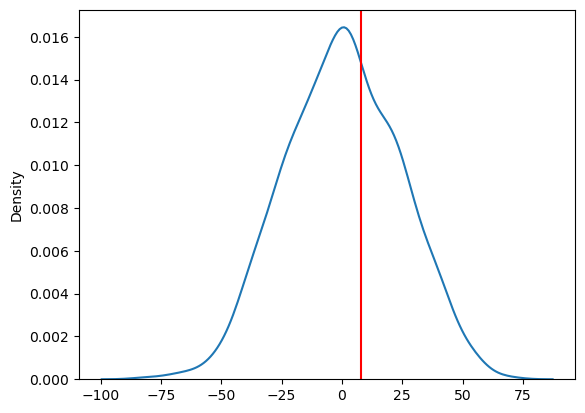

In [71]:
#plot the difference in means
sns.kdeplot(sample_mean_diffs, label='Difference in Means Under Permutation')
plt.axvline(true_mean_diff, label="Difference in Sample Means", color='red')

You can see in the plot above that the line showing the mean differences in resolution time for summer and winter from the population fall within the distribution of the sample means. This implies that the p-value will be large. 

In [73]:
#get the p-value

print('The p-value is:', (pd.Series(sample_mean_diffs) > mean_diff).mean())

NameError: name 'mean_diff' is not defined

I will use 0.05 (5%) as the cutoff for my p-value. A p-value of 0.369 is larger than 0.05, which means that the result is not statistically significant, and that we cannot reject the null hypothesis, which was that the difference between the mean resolution time for a sidewalk issue case in summer and the mean resolution time for a sidewalk issue case in winter is zero. 

This result also doesn't give me a lot of confidence to say that the particular season has anything to do with the resolution time in hours for a sidewalk issue in Berkeley. It could be that the city has very consistent response times, or alternatively that the factors influencing resolution time, if any, are not reflected in the dataset. 

# Conclusion



The result of my statistical analysis on mean resolution time for sidewalk issues in Berkeley yielded a statistically insignificant result. I cannot make a reliable conclusion about the relationship between the season a case is opened for a sidewalk issue, and the time taken in hours to resolve the issue. 

**Further Exploration** 

If I were to continue working on this project, add to it, or do it differently, there are quite a few things I would try. 

Berkeleyside, our local news outlet in Berkeley, published this article https://www.berkeleyside.org/2023/03/06/berkeley-streets-most-pothole-complaints-top-five#:~:text=One%20thing%20that%20may%20surprise,is%20five%20to%20six%20days. where they used 311 data to discuss pothole repairs in Berkeley. Of interest to me in this article is the part where they discuss where most of the complaints about potholes come from, which is the Berkeley Hills. This is a wealthier area of the city. The author of the article goes on to state that lower income residents may not report as many potholes or use 311 to make complaints, and cites to a research study describing this phenomenon. That study can be found here: https://www.sciencedirect.com/science/article/abs/pii/S2210670720307216?fr=RR-2&ref=pdf_download&rr=8a607ac81969cf72. 

I also found out that with respect to sidewalk repair in Berkeley, the city has a 50-50 model. Property owners can either repair the sidewalk themselves with a private contractor or they can split the cost with the city 50-50, and the city will cover the labor. More information here: https://berkeleyca.gov/city-services/streets-sidewalks-sewers-and-utilities/sidewalk-repair. This presents the potential problem where lower income residents would probably not want to shoulder the burden of sidewalk repair wholly or even partially. This may lend itself to underreporting of damaged sidewalks through 311. 

Another editorial from PBS SoCal discusses potential policy solutions to the policy problem around some sidewalks. California allows cities to place the burden of repair on the property owner, and some cities do have municipal codes that require property owners to fix the sidewalk. https://www.pbssocal.org/socal-focus/footsore-l-a-s-sidewalk-mess-needs-better-ideas. If the property owner has the money and is prompted to make the fix, the sidewalk is likely to be repaired, whereas if they are lower income, fixing the sidewalk may not be a priority. 

Given this brief research, I think it could be interesting to look at whether median income of a particular census tract in Berkeley has a relationship to the resolution time of sidewalk issues. I could use the American Community Survey (ACS) data, which includes socioeconomic data about different US cities, and includes variables like census tracts. Since the Berkeley 311 data includes latitude and longitude, I can geocode them to the census tracts in the ACS data. I've done something similar before with police beats and census tracts, and I think it would be possible with the 311 dataset as well. 

I could also create a chloropleth map (using GeoJSON, I believe) of the census tracts with the greatest 311 requests for sidewalk issues, similar to the one in the Berkeleyside article.

Additionally, since the variables are numeric for median income and for resolution time, it would be possible to use linear regression models, like OLS, LASSO, and Ridge models, and compare the three models. The 311 dataset as is, does not make for a good dataset for a predictive model. There aren't many variables you can use as predictive variables. 

Another simple addendum to this project would be to bootstrap the mean resolution time for all four seasons for which I have resolution times for sidewalk issues. Then I could compare the confidence intervals for the samples and rank them. 

**Notes**
I have included links to websites I referred to while working on this project throughout the notebook. 

I have also included an attached transcript of a conversation with ChatGPT when trying to figure out how to deal with the date time columns (it is commented that it was used in that cell) and find the resolution_time. The transcript should be accessible here: https://drive.google.com/file/d/1ntr3blbungcrfkITS-8V5i3q4n3qFgCR/view?usp=sharing. Please let me know if there are any issues viewing it.